In [3]:
import matplotlib.pyplot as plt
from scipy import signal
from scipy.io import wavfile
import os
import IPython
import math
import numpy as np
from scipy.signal import medfilt
import sympy
from scipy.sparse import csc_matrix,lil_matrix
import librosa.core as lc
sympy.init_printing()
import IPython.display as ipd
import scipy
import soundfile as sf

%matplotlib inline


In [4]:
base_dir="AudioFiles"
file_name="há gente aqui_RED.wav"

# Interpolation of missing samples

Há gente aqui

In [14]:
file_path = os.path.join(base_dir,file_name)
sample_rate,samples = wavfile.read(file_path)
time = np.arange(samples.shape[0])/sample_rate
IPython.display.Audio(samples,rate=sample_rate)
samples_vector = samples.reshape((samples.shape[0],1))

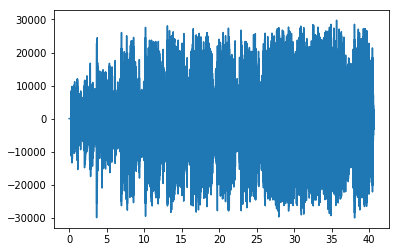

40.596757369614515


In [15]:
plt.plot(time,samples)
plt.show()

print(max(time))

In [32]:
median_filtered = medfilt(samples,kernel_size=33)
IPython.display.Audio(median_filtered,rate=sample_rate)

In [17]:
def get_X(x,I):
    """
    construct X matrix for autoregressive model as defined in page 34 of
    the thesis
    """
    x_extended = np.zeros([x.shape[0],I])
    X = np.zeros((x.shape[0]-I,I))
    for i in range(I):
        #define selector for each line
        X[:,i] = x[I-i-1:(x.shape[0] -1 - i),0].reshape([x[I-i-1:(x.shape[0] -1 - i),0].shape[0]])
    return X

In [18]:
def autoregressive_matrix(x,I):
    """
    Calculate autoregressive model of I coefficients from signal x using LS method
    to minimize the prediction error energy
    """
    X = get_X(x,I)
    X_t = np.transpose(X)
    x_i = x[I:]
    a = np.matmul(X_t,X)
    b = np.linalg.pinv(a)
    c = np.matmul(b,X_t)
    a_ls = np.matmul(c,x_i)
    return a_ls

In [19]:
#to be removed - noise detection
def get_A(a,K):
    """
    construct A matrix as defined in page 124 of the thesis.
    """
    I = a.shape[0]
    A = np.zeros([K-I,K])
    for i in range(K-I):
        A[i,i:i+I] = -1*np.transpose(a)
        A[i,i+I] = 1
    return A


In [20]:
def ls_interpolation(A_d,A_c,x_c):
    """
    LS interpolation as defined in page 113 of the thesis
    """
    A_d_t = np.transpose(A_d)
    x_d = np.matmul(np.matmul(np.matmul(np.linalg.inv(np.matmul(A_d_t,A_d)),A_d_t),A_c),x_c)
    return x_d

In [105]:
#values taken from page 130
I = 100

window_length=0.02 #20ms, minimum variation we (humans) can hear
window_samples=int(window_length*sample_rate)
noise_start = 300000
windowstart = int(noise_start - window_samples/2)
windowend = int(noise_start + window_samples/2)
#we put the noise exactly in the middle of the window used for the autoregressive model
window = samples_vector[windowstart:windowend]
a = autoregressive_matrix(samples_vector,I)


K=samples_vector.shape[0]
A = get_A(a,window_samples)

In [106]:
missing_samples = 400
noise_start = int(window_samples/2)
noise_end = noise_start + missing_samples


A_d = A[:,noise_start:noise_end]
x_d = window[noise_start:noise_end]

known_indexes = np.r_[:noise_start,noise_end:]
A_c = A[:,known_indexes]
x_c = window[known_indexes]

x_d_ls = ls_interpolation(A_d,A_c,x_c)

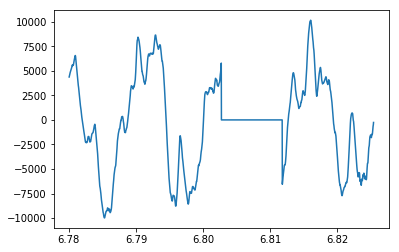

In [107]:
noise_start = 300000
incomplete_x = samples_vector.copy()
incomplete_x[noise_start:noise_start + missing_samples,:] *= 0
audio_start = noise_start - 100000
plt.plot(time[noise_start-1000:noise_start+1000],incomplete_x[noise_start-1000:noise_start+1000,0])
plt.show()
IPython.display.Audio(incomplete_x[audio_start:,0],rate=sample_rate)


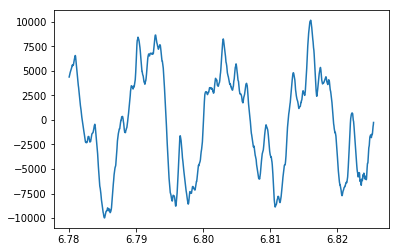

In [108]:
plt.plot(time[noise_start-1000:noise_start+1000],samples_vector[noise_start-1000:noise_start+1000,0])
plt.show()

In [109]:
IPython.display.Audio(samples_vector[audio_start:,0].astype(int),rate=sample_rate)



In [110]:
reconstructed_x = incomplete_x.copy()
reconstructed_x[noise_start:noise_start + missing_samples,:] = x_d_ls

In [111]:
IPython.display.Audio(reconstructed_x[audio_start:,0].astype(int),rate=sample_rate)

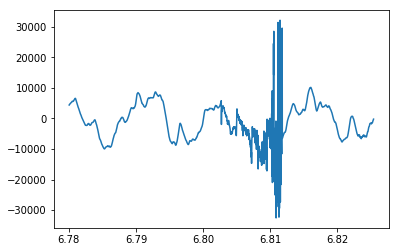

In [112]:
plt.plot(time[noise_start-1000:noise_start+1000],reconstructed_x[noise_start-1000:noise_start+1000,0])
plt.show()